# Urban Mobility for 5G Cellular Networks
### Federica Biancucci, Federica Latora, Carlotta Segna and Tommaso Soravia

## Import

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
FunctionKalmanFilter = drive.CreateFile({'id':'1PV-jOAHRuXjRbpbqDNN3IXP4zQQR1_62'})
FunctionKalmanFilter.GetContentFile('FunctionKalmanFilter.ipynb')

FunctionKalmanFilter = drive.CreateFile({'id':'1OYBeglCXxyTRLUB2SVCISb7Oj5ln9E_g'})
FunctionKalmanFilter.GetContentFile('FunctionKalmanFilter3.ipynb')

In [ ]:
import numpy as np
from scipy.io import loadmat 
import matplotlib.pyplot as plt
from datetime import datetime, date, time
import pandas as pd
from matplotlib.colors import ListedColormap
from matplotlib import cm
import matplotlib.image as mpimg
import math

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, r2_score, plot_confusion_matrix
from scipy.io import loadmat 
from tensorflow import keras
from keras.utils import to_categorical
from keras.models import Sequential, load_model
from tensorflow.keras import layers, regularizers
from tensorflow.keras.layers import GRU, Flatten, Dense, BatchNormalization, Conv1D
from numpy import argmax

plt.style.use('seaborn')

!pip install import_ipynb
import import_ipynb


## Setup
We consider an urban 5G scenario in the center of the city of Cologne (950 × 1120 square meters), with 5G
enabled vehicles that move around while being continuously connected to the 5G network. The mobility
is emulated with SUMO, an open-source traffic simulation suite that allows generating the movement of
emulated users around a predefined city road map, and extracting the needed metrics. Base stations
(BSs) were deployed on a grid topology, and the mobility area has been covered with hexagonal 5G cells
with a radius of 40 m, each with a BS in its center.
The goal of the project is to map this data on a network and implement algorithms that predict the evolution of the traffic. In order to solve this task we have exploited two different methods: Kalman Filter (KF) and a Recurrent Neural Network (RNN).



In [ ]:
from google.colab import drive
drive.mount('/content/drive')
coord = loadmat('drive/My Drive/Colab Notebooks/coordinate_BS.mat')
traces = loadmat('drive/My Drive/Colab Notebooks/traces.mat')
img = mpimg.imread('drive/My Drive/Colab Notebooks/mappa_città.png') # street layout of the Cologne urban area 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Dataset
The dataset is composed of two mat files: "traces.mat" and "coordinate_BS.mat". 

The traces is a $6990456 \times 10$ matrix, each line contains:
1. time of the measurement (with 1-second granularity)
2. vehicle ID
3. absolute x coordinate of the vehicle location in meters
4. absolute y coordinate of the vehicle location in meters
5. speed of the vehicle in meters per second
6. hexagonal cell associated with the x-y location
7. hexagonal cell to which the user will be connected in the next time step
8. hexagonal cell visited before the current one (cell C - 1) 
9. hexagonal cell C - 2
10. hexagonal cell C - 3.





In [ ]:
data = traces['traces_data']
columns = ['time', 'ID', 'car_x', 'car_y', 'm/s', 'C', 'C+1', 'C-1', 'C-2', 'C-3']
df = pd.DataFrame(data, columns=columns)
df

,time,ID,car_x,car_y,m/s,C,C+1,C-1,C-2,C-3
0,37081.0,1.0,13379.670000,13854.720000,0.00,174.0,174.0,-5.0,-6.0,-7.0
1,37082.0,1.0,13379.322115,13852.335241,2.41,174.0,174.0,-5.0,-6.0,-7.0
2,37083.0,1.0,13378.633564,13847.615199,4.77,174.0,174.0,-5.0,-6.0,-7.0
3,37084.0,1.0,13377.623111,13840.688512,7.00,174.0,174.0,-5.0,-6.0,-7.0
4,37085.0,1.0,13376.544813,13833.296749,7.47,174.0,174.0,-5.0,-6.0,-7.0
...,...,...,...,...,...,...,...,...,...,...
6990451,9701.0,718139.0,13298.744559,14142.249728,7.20,149.0,149.0,148.0,147.0,162.0
6990452,9702.0,718139.0,13299.334700,14149.485703,7.25,149.0,149.0,148.0,147.0,162.0
6990453,9703.0,718139.0,13299.933783,14156.831314,7.37,149.0,149.0,148.0,147.0,162.0
6990454,9704.0,718139.0,13300.560504,14164.515800,7.72,149.0,149.0,148.0,147.0,162.0


A negative number in columns C+1, C-1, C-2 or C-3 is referred to time steps out of the recorded trajectory.

The second file contains the deployment of cellular base stations. The BS location information is in the same format used for the vehicle positions:
1. absolute x coordinate of the BS location in meters
2. absolute y coordinate of the BS location in meters


In [ ]:
data = coord['BSCoordinates']
columns = ['X', 'Y']
BS_loc = pd.DataFrame(data, columns=columns)
BS_loc

,X,Y
0,12740.0,13234.641016
1,12740.0,13303.923048
2,12740.0,13373.205081
3,12740.0,13442.487113
4,12740.0,13511.769145
...,...,...
220,13580.0,13927.461339
221,13580.0,13996.743371
222,13580.0,14066.025404
223,13580.0,14135.307436


## Superimposition
Starting form the street layout of the Cologne urban area we have extracted the portion of the map we were interested in. We have therefore superimposed the BS locations to the selected area.


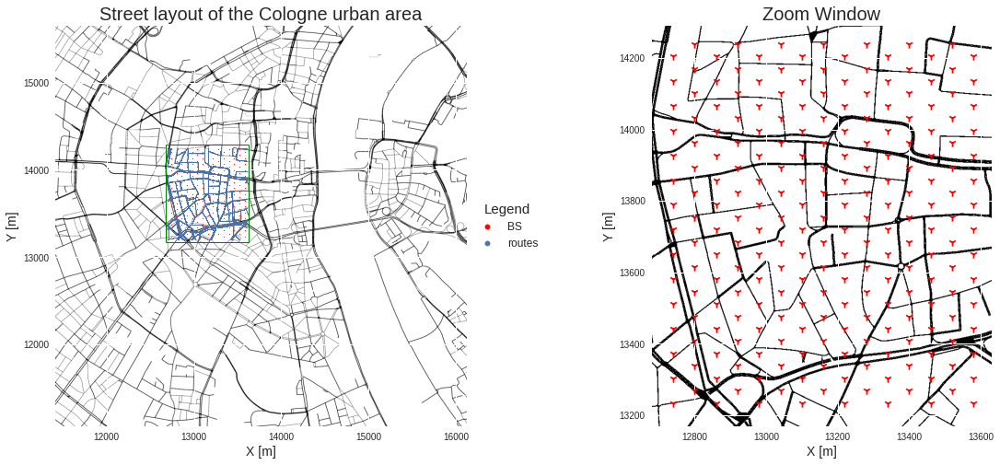

In [ ]:
limit_coord = [12680,13630,13170, 14290]
extent = [11409.5+6, 16115+6, 11070.45-5, 15655-5]
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 8))
ax = plt.subplot2grid(gridsize, (0, 0), colspan=1, rowspan=1)
ax.imshow(img,extent=extent)
ax.scatter(BS_loc['X'],BS_loc['Y'],s = 0.7,color = 'red', label = "BS")
ax.scatter(df['car_x'],df['car_y'], s = .05,label = "routes")
ax.vlines(x=limit_coord[0], ymin=limit_coord[2], ymax=limit_coord[3],linewidth=1,color = 'green')
ax.vlines(x=limit_coord[1], ymin=limit_coord[2], ymax=limit_coord[3],linewidth=1,color = 'green')
ax.hlines(y=limit_coord[2], xmin=limit_coord[0], xmax=limit_coord[1],linewidth=1,color = 'green')
ax.hlines(y=limit_coord[3], xmin=limit_coord[0], xmax=limit_coord[1],linewidth=1,color = 'green')
lgnd = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),title = "Legend",prop={'size': 12},markerscale=10)
#change the marker size manually for both lines
lgnd.legendHandles[0]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]
ax.set_title('Street layout of the Cologne urban area', fontsize=20)
ax.set_xlabel("X [m]", fontsize = 14)
ax.set_ylabel("Y [m]", fontsize = 14)
plt.setp(lgnd.get_title(),fontsize=15)

ax1 = plt.subplot2grid(gridsize, (0, 1))
ax1.imshow(img,extent=extent)
scatter = ax1.scatter(x=BS_loc['X'], y=BS_loc['Y'], s = 70, marker = "1",linewidths=1,color = 'red')
ax1.set_title('Zoom Window', fontsize=20)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]", fontsize = 14)
ax1.set_ylabel("Y [m]", fontsize = 14)
#plt.scatter(df['car_x'],df['car_y'], s = 0.1)
plt.show()

In the following images we have analized some metrics which could be useful to enhance the 5G network performance. We have taken into account the average sojourn time in each BS, the maximum number of cars connected to the same BS at the same time and finally the number of cars which pass through each BS a day. 

In [ ]:
num_car_per_base = np.array([])
max_car_per_base = np.array([])
mean_time_per_base = np.array([])
for i in range(1,225+1):
    base_i = df[df['C'] == i]
    uniq_cars = base_i.drop_duplicates(subset = 'ID')
    num_car_per_base = np.append(num_car_per_base,uniq_cars.count()[0])
    
    dups_car = base_i.pivot_table(index=['time'], aggfunc='size')
    max_car_per_base = np.append(max_car_per_base,dups_car.max())

    mean_time_per_base = np.append(mean_time_per_base,base_i.count()[0]/uniq_cars.count()[0])
mean_time_per_base = np.nan_to_num(mean_time_per_base)    

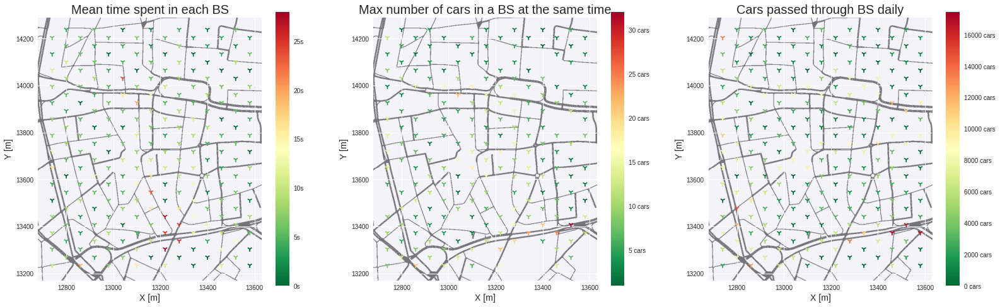

In [ ]:
gridsize = (1, 3)
fig = plt.figure(figsize=(27, 8))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha=0.5)
scatter = ax1.scatter(x=BS_loc['X'], y=BS_loc['Y'], c=mean_time_per_base, cmap = cm.get_cmap('RdYlGn').reversed(), s = 70, marker = "1",linewidths=1)
plt.colorbar(scatter, ax=ax1, format='%ds')
ax1.set_title('Mean time spent in each BS', fontsize=20)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]", fontsize = 14)
ax1.set_ylabel("Y [m]", fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha=0.5)
scatter = ax2.scatter(x=BS_loc['X'], y=BS_loc['Y'], c=max_car_per_base, cmap = cm.get_cmap('RdYlGn').reversed(), s = 70, marker = "1",linewidths=1)
plt.colorbar(scatter, ax=ax2, format='%d cars')
ax2.set_title('Max number of cars in a BS at the same time', fontsize=20)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]", fontsize = 14)
ax2.set_ylabel("Y [m]", fontsize = 14)

ax3 = plt.subplot2grid(gridsize, (0, 2))
ax3.imshow(img,extent=extent, alpha=0.5)
scatter = ax3.scatter(x=BS_loc['X'], y=BS_loc['Y'], c=num_car_per_base, cmap = cm.get_cmap('RdYlGn').reversed(), s = 70, marker = "1",linewidths=1)
plt.colorbar(scatter, ax=ax3, format='%d cars')
ax3.set_title('Cars passed through BS daily', fontsize=20)
ax3.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax3.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax3.set_xlabel("X [m]", fontsize = 14)
ax3.set_ylabel("Y [m]", fontsize = 14)
plt.show()

The below image shows the structure of demand data over 24 hour period. This shows normal behavior of mobility. Peak hours like ~7-8am , ~4-6pm during which the number of trips are usually high.

In [ ]:
min_time = np.int(np.min(df['time']))
max_time = np.int(np.max(df['time']))
samp_time = np.linspace(min_time,max_time,num = max_time-min_time+1)
#count car
car_per_time = np.array([])
for i in samp_time:
  inst_time = df[df['time']==i]
  cars = inst_time.count()[0]
  car_per_time = np.append(car_per_time,cars)

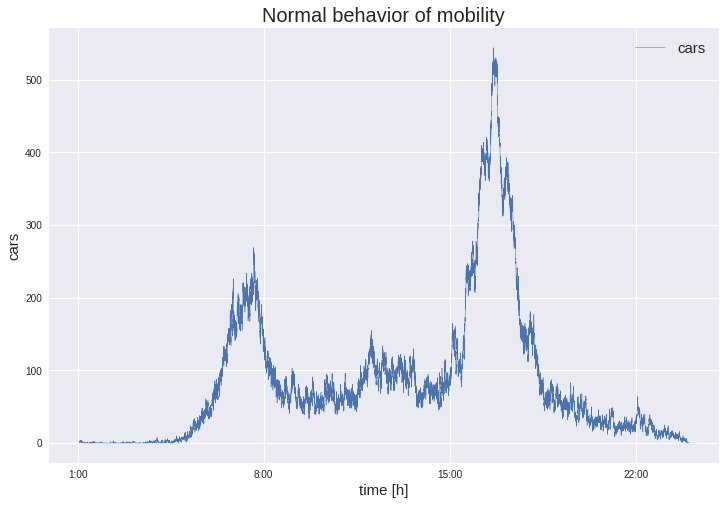

In [ ]:
ticks = [3600, 28800, 54000, 79200]
labels_time =  ['1:00', '8:00', '15:00', '22:00']
gridsize = (1, 1)
fig = plt.figure(figsize=(12, 8))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.plot(samp_time,car_per_time,linewidth=.5, label = "cars")
ax1.set_xticks(ticks, minor=False)
ax1.set_xticklabels(labels_time, fontdict=None, minor=False)
ax1.set_ylabel("cars",fontsize = 15)
ax1.set_xlabel("time [h]",fontsize = 15)
ax1.legend(loc='best',fontsize = 15)
ax1.set_title("Normal behavior of mobility",fontsize = 20)
plt.show()

## Kalman Filter

### Introduction and application to our task

The Kalman filter is an algorithm that provides estimates of some unknown variables given the measurements observed over time, containing statistical noise or other inaccuracies. It is composed by a set of mathematical equations that implement a predictor-corrector type estimator that is optimal in the sense that it minimizes the estimated error covariance.

In our task, the Kalman filter provides an accurate, continuously updated information about the position and velocity of a vehicle given only a sequence of observations about its position, each of which includes some error. Indeed, the Kalman filter exploits the dynamics that govern the time evolution of the position of the vehicle, to remove the effects of the noise and
get a good estimate of the location of the vehicle at the present time (filtering) and at a future time (prediction).

We developed to different types of Kalman Filters. In order to obtain a clear and modular code, we implemented both methods in two differents files ($\texttt{FunctionKalmanFilter.ipynb}$ and $\texttt{FunctionKalmanFilter3.ipynb}$). For more details about the mathematical formulas of Kalman Filters and about how these filters work,  see these files.

The first type of Kalman Filter, implemented in the function $\texttt{Kalman_Filter}$, predicts the base cells C+1 that pick up the cars at time instant t+1. The second, contained in the function $\texttt{Kalman_Filter_C2}$, uses instead the know prediction C+1 to predict the next base cells C+2 that pick up the cars at time instant t+2.

###Prediction of the base cells C+1 
Here, we use the Kalman Filter to predict the trajectories of four different vehicles.

In [ ]:
from FunctionKalmanFilter import Kalman_Filter
measurements_a, pred0_a, pred1_a, mes0_a, mes1_a, index_BS_pred_a = Kalman_Filter(df,BS_loc,1)
measurements_b, pred0_b, pred1_b, mes0_b, mes1_b, index_BS_pred_b = Kalman_Filter(df,BS_loc,46)
measurements_c, pred0_c, pred1_c, mes0_c, mes1_c, index_BS_pred_c = Kalman_Filter(df,BS_loc,409)
measurements_d, pred0_d, pred1_d, mes0_d, mes1_d, index_BS_pred_d = Kalman_Filter(df,BS_loc,16)

importing Jupyter notebook from FunctionKalmanFilter.ipynb
ID 1

% of times the car is connected to the nearest BS (prediction) : 72.0 %

% of times the car is connected to the nearest BS (real mesurement) : 86.0 %
ID 46

% of times the car is connected to the nearest BS (prediction) : 87.06896551724138 %

% of times the car is connected to the nearest BS (real mesurement) : 93.53448275862068 %
ID 409

% of times the car is connected to the nearest BS (prediction) : 47.651933701657455 %

% of times the car is connected to the nearest BS (real mesurement) : 49.033149171270715 %
ID 16

% of times the car is connected to the nearest BS (prediction) : 91.46341463414635 %

% of times the car is connected to the nearest BS (real mesurement) : 91.46341463414635 %


<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

We have computed the percentages of times the car is connected to the closest base station. We notice that the percentages in the predicted case are smaller then the one in the real case. Indeed, these percentages, in the predicted case, are obtained checking if the nearest base station (in terms of Euclidean Distance) to the predicted coordinates by the filter is the real next base station that we know from the dataset (column C+1). But each vehicle connects with the base stations in order to provide the best communication conditions in terms of path loss (PL), not in terms of Euclidean Distance. For this reason, these percentages are not too high. 

We also notice that for the ID=16 these two percentages are identical. This means that, in this case, the Kalman Filter predicts correctly all the base stations.



###Prediction of the base cells C+2
 

In [ ]:
from FunctionKalmanFilter3 import Kalman_Filter_C2
measurements_a_c2, pred0_a_c2, pred1_a_c2, mes0_a_c2, mes1_a_c2 = Kalman_Filter_C2(df,BS_loc,1)
measurements_b_c2, pred0_b_c2, pred1_b_c2, mes0_b_c2, mes1_b_c2 = Kalman_Filter_C2(df,BS_loc,46)
measurements_c_c2, pred0_c_c2, pred1_c_c2, mes0_c_c2, mes1_c_c2 = Kalman_Filter_C2(df,BS_loc,409)
measurements_d_c2, pred0_d_c2, pred1_d_c2, mes0_d_c2, mes1_d_c2 = Kalman_Filter_C2(df,BS_loc,16)

importing Jupyter notebook from FunctionKalmanFilter3.ipynb


FunctionKalmanFilter3.ipynb:77: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


ID 1

% of times the car is connected to the nearest BS (prediction) : 13.131313131313131 %
ID 46


FunctionKalmanFilter3.ipynb:77: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



% of times the car is connected to the nearest BS (prediction) : 51.515151515151516 %


FunctionKalmanFilter3.ipynb:77: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


ID 409

% of times the car is connected to the nearest BS (prediction) : 38.86583679114799 %
ID 16


FunctionKalmanFilter3.ipynb:77: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



% of times the car is connected to the nearest BS (prediction) : 53.374233128834355 %


<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

As we have explained before, the percentages of correct prediction do not seem so good because the vehicle connects with the base stations in order to provide the best communication conditions in terms of path loss (PL), not in terms of Euclidean Distance.

In the below plots, are represented the trajectories of the four vehicles analyzed. In particular, the real trajectory (green line) represents the real trajectory that we know from the dataset. Instead, the dashed red line indicates the predicted trajectory obtained knowing the velocity and the angle of direction. The measured trajectory (dot blue line) represents the predicted trajectory of the vehicle after the update step performed by the Kalman Filter. 

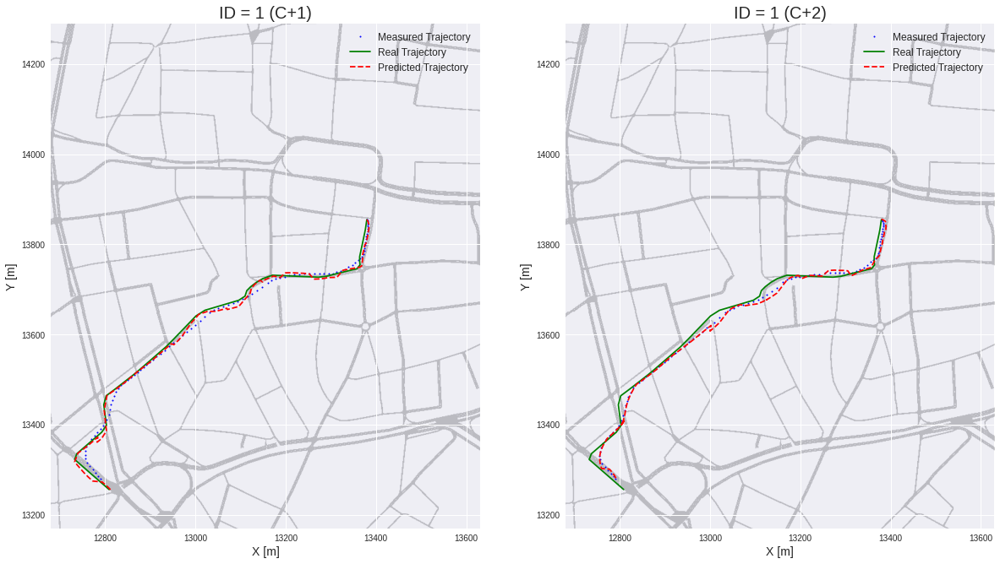

In [ ]:
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(mes0_a, mes1_a, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax1.plot(measurements_a[:, 0], measurements_a[:, 1], 'g',label="Real Trajectory") #real
ax1.plot(pred0_a, pred1_a, 'r--',label="Predicted Trajectory")#predict
ax1.legend(loc="best", fontsize = 12)
ax1.set_title('ID = 1 (C+1)', fontsize=20)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]", fontsize = 14)
ax1.set_ylabel("Y [m]", fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(mes0_a_c2, mes1_a_c2, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax2.plot(measurements_a_c2[:, 0], measurements_a_c2[:, 1], 'g',label="Real Trajectory") #real
ax2.plot(pred0_a_c2, pred1_a_c2, 'r--',label="Predicted Trajectory")#predict
ax2.legend(loc="best", fontsize = 12)
ax2.set_title('ID = 1 (C+2)', fontsize=20)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]", fontsize = 14)
ax2.set_ylabel("Y [m]", fontsize = 14)
plt.show()

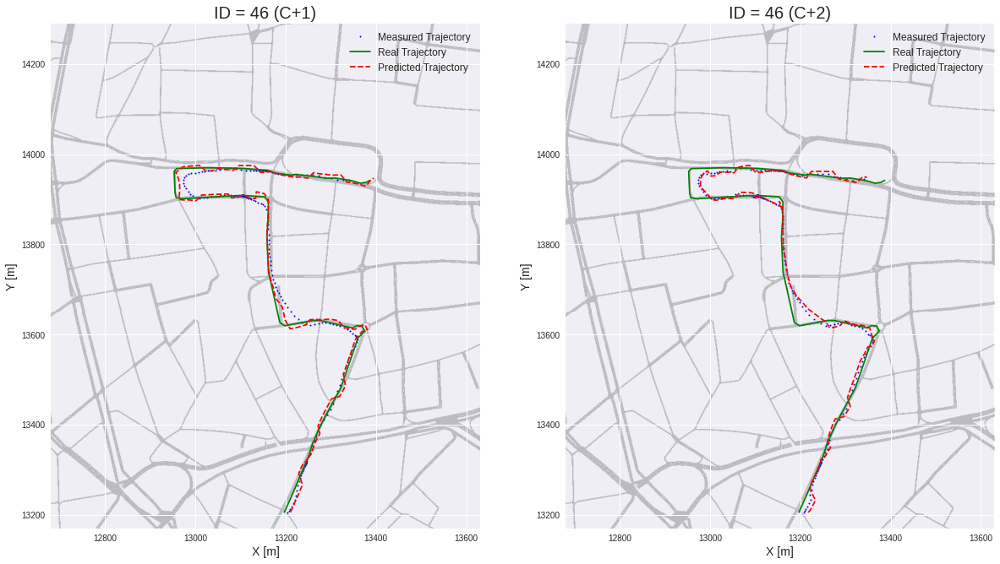

In [ ]:
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(mes0_b, mes1_b, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax1.plot(measurements_b[:, 0], measurements_b[:, 1], 'g',label="Real Trajectory") #real
ax1.plot(pred0_b, pred1_b, 'r--',label="Predicted Trajectory")#predict
ax1.legend(loc="best", fontsize = 12)
ax1.set_title('ID = 46 (C+1)', fontsize=20)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]", fontsize = 14)
ax1.set_ylabel("Y [m]", fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(mes0_b_c2, mes1_b_c2, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax2.plot(measurements_b_c2[:, 0], measurements_b_c2[:, 1], 'g',label="Real Trajectory") #real
ax2.plot(pred0_b_c2, pred1_b_c2, 'r--',label="Predicted Trajectory")#predict
ax2.legend(loc="best", fontsize = 12)
ax2.set_title('ID = 46 (C+2)', fontsize=20)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]", fontsize = 14)
ax2.set_ylabel("Y [m]", fontsize = 14)
plt.show()

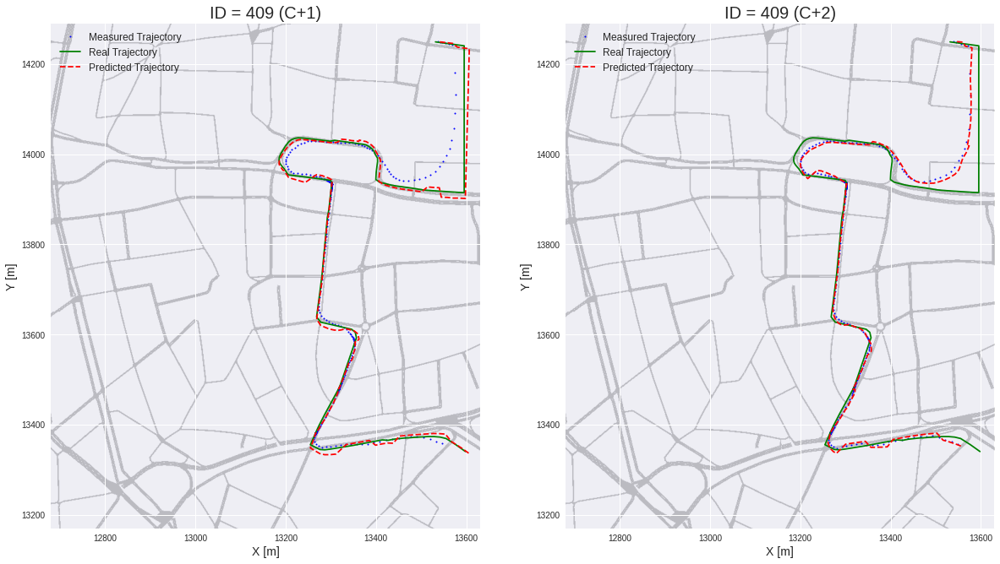

In [ ]:
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(mes0_c, mes1_c, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax1.plot(measurements_c[:, 0], measurements_c[:, 1], 'g',label="Real Trajectory") #real
ax1.plot(pred0_c, pred1_c, 'r--',label="Predicted Trajectory")#predict
ax1.legend(loc="best", fontsize = 12)
ax1.set_title('ID = 409 (C+1)', fontsize=20)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]", fontsize = 14)
ax1.set_ylabel("Y [m]", fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(mes0_c_c2, mes1_c_c2, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax2.plot(measurements_c_c2[:, 0], measurements_c_c2[:, 1], 'g',label="Real Trajectory") #real
ax2.plot(pred0_c_c2, pred1_c_c2, 'r--',label="Predicted Trajectory")#predict
ax2.legend(loc="best", fontsize = 12)
ax2.set_title('ID = 409 (C+2)', fontsize=20)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]", fontsize = 14)
ax2.set_ylabel("Y [m]", fontsize = 14)
plt.show()

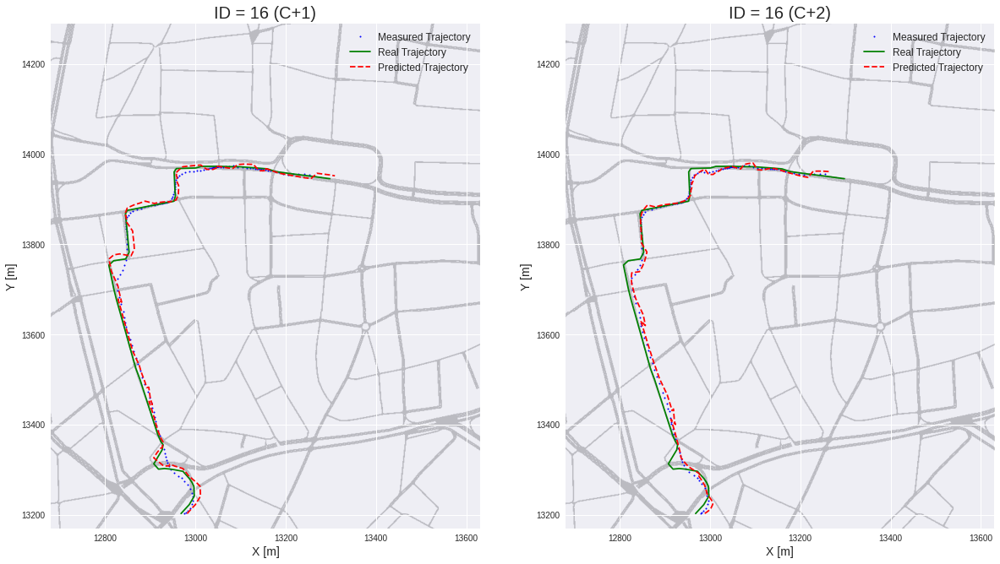

In [ ]:
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(mes0_d, mes1_d, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax1.plot(measurements_d[:, 0], measurements_d[:, 1], 'g',label="Real Trajectory") #real
ax1.plot(pred0_d, pred1_d, 'r--',label="Predicted Trajectory")#predict
ax1.legend(loc="best", fontsize = 12)
ax1.set_title('ID = 16 (C+1)', fontsize=20)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]", fontsize = 14)
ax1.set_ylabel("Y [m]", fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(mes0_d_c2, mes1_d_c2, 'bo',label="Measured Trajectory",markersize=2) #This is the measured value
ax2.plot(measurements_d_c2[:, 0], measurements_d_c2[:, 1], 'g',label="Real Trajectory") #real
ax2.plot(pred0_d_c2, pred1_d_c2, 'r--',label="Predicted Trajectory")#predict
ax2.legend(loc="best", fontsize = 12)
ax2.set_title('ID = 16 (C+2)', fontsize=20)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]", fontsize = 14)
ax2.set_ylabel("Y [m]", fontsize = 14)
plt.show()

### GIF

In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display


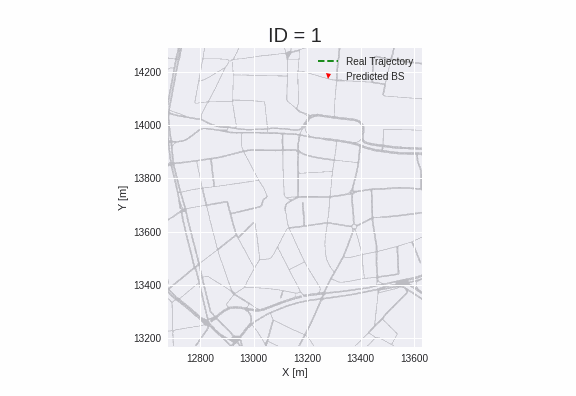

In [ ]:
gifPath = "drive/My Drive/Colab Notebooks/demo_1_KF.gif" 
# Display GIF
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

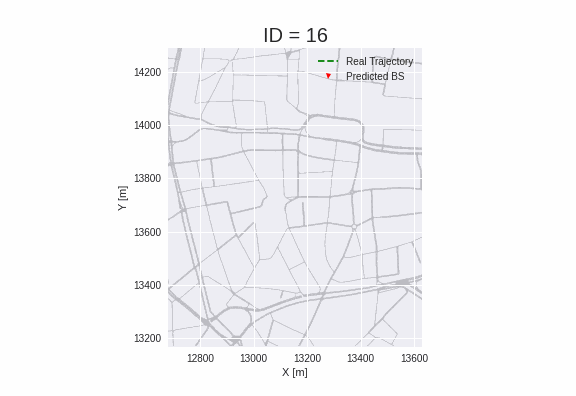

In [ ]:
gifPath = "drive/My Drive/Colab Notebooks/demo_16_KF.gif"
# Display GIF
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

### GIF CODE

In [ ]:
from matplotlib.animation import FuncAnimation, PillowWriter
fig,ax = plt.subplots()
ln1, = plt.plot([], [], 'g--',label="Real Trajectory",markersize=2)
ln2, = plt.plot([], [],'rv', markersize = 5, label="Predicted BS")

In [ ]:
def init():
  ax.imshow(img,extent=extent, alpha= 0.2)
  ax.set_xlabel("X [m]")
  ax.set_ylabel("Y [m]")
  ax.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
  ax.axis(xmin = limit_coord[0], xmax = limit_coord[1])
  ax.legend(loc="best")
  ax.set_title('ID = 16', fontsize=20)

def update(i):
  #ln1.set_data(mes0_a[:i],mes1_a[:i])
  ln1.set_data(measurements_d[:i, 0],measurements_d[:i, 1])
  ln2.set_data(BS_loc['X'][index_BS_pred_d[:i]],BS_loc['Y'][index_BS_pred_d[:i]] )
  #ln3.set_data(pred0_a[:i],pred1_a[:i])

In [ ]:
ani = FuncAnimation(fig,update,init_func=init)
plt.show()

In [ ]:
writer = PillowWriter(fps=10)  
ani.save("drive/My Drive/Colab Notebooks/demo_16_KF.gif", writer=writer)

## Recurrent Neural Network

The aim of this session is try to predict which base cells will pick up the cars at time instant t+1 by using a suitable neural network.
For this purpose, information about the cell bases at times t-3, t-2, t-1 and t will be used to train the network to predict with high accuracy the cell base at the next time.

Once the dataset is loaded, only the columns of interest are kept. Moreover, since there are negative numbers in columns 7, 8, 9 or 10, that are referred to time steps out of the recorded trajectory, a more accurate result can be obtained by discarding the rows where negative values are present.
The column for base cells at time instant t+1 is separated from the dataset of interest as it is the reference label for the network.
Since the network will have to classify the next BS from a set of 182 cells, One-Hot encoding was used to include a 'softmax' activation function at the network output to decide which is the next most likely cell for each corresponding input.

In [ ]:

temp_df = df[['time', 'ID', 'C', 'C+1', 'C-1', 'C-2', 'C-3']]

temp_df.drop(temp_df[temp_df["C-1"]<0].index , inplace = True)
temp_df.drop(temp_df[temp_df["C-2"]<0].index , inplace = True)
temp_df.drop(temp_df[temp_df["C-3"]<0].index , inplace = True)
temp_df.drop(temp_df[temp_df["C+1"]<0].index , inplace = True)

y = temp_df['C+1']
temp_df = temp_df[['time', 'ID', 'C-3', 'C-2', 'C-1', 'C']]
encoded = to_categorical(y)
print(temp_df)
del df

The training phase starts by dividing the entire dataset into training and test sets, so that 90% of the data is used to train the network, while 10% is used as a gold standard to test whether the model is able to generalise over never seen data.

In [ ]:
X_train, x_test, y_train, y_test = train_test_split(temp_df[['C-3', 'C-2', 'C-1', 'C']], encoded, test_size = 0.1, random_state = 0)
X_train = (X_train.to_numpy()).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = (x_test.to_numpy()).reshape(x_test.shape[0], X_train.shape[1], 1)

Since we need to analyse and extract information from data that have a temporal dependency between them, the most optimal model to implement is a Recurrent Neural Network. In particular, for this purpose, it is sufficient to use a GRU followed by a Dense layer for the final classification.
It is important to note that layers such as GRU or LSTM take 3D data as input: for this reason it is necessary to reshape the dataset in order to obtain a size equal to [batch, timestep, features]. 

In [ ]:
model = Sequential()
model.add(GRU(128, activation='tanh', recurrent_activation='sigmoid'))
model.add(Flatten())
model.add(Dense(222, activation = 'softmax'))

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=10000,
    decay_rate=0.9)
optimizer = keras.optimizers.Adam(learning_rate=lr_schedule)

model.compile(loss="mse", optimizer="adam",metrics=['accuracy'])
history = model.fit(X_train, y_train, validation_split=0.2, batch_size = 64, epochs = 10)
train_loss = history.history['loss'] #contain all training loss
#model.save('my_model.h5')
#np.save('my_history.npy',history.history)

Epoch 1/10
54546/54546 [==============================] - 500s 9ms/step - loss: 0.0026 - accuracy: 0.5662 - val_loss: 0.0018 - val_accuracy: 0.7302
Epoch 2/10
54546/54546 [==============================] - 502s 9ms/step - loss: 0.0017 - accuracy: 0.7444 - val_loss: 0.0016 - val_accuracy: 0.7706
Epoch 3/10
54546/54546 [==============================] - 495s 9ms/step - loss: 0.0016 - accuracy: 0.7669 - val_loss: 0.0015 - val_accuracy: 0.7768
Epoch 4/10
54546/54546 [==============================] - 483s 9ms/step - loss: 0.0015 - accuracy: 0.7741 - val_loss: 0.0015 - val_accuracy: 0.7780
Epoch 5/10
54546/54546 [==============================] - 488s 9ms/step - loss: 0.0015 - accuracy: 0.7768 - val_loss: 0.0016 - val_accuracy: 0.7723
Epoch 6/10
54546/54546 [==============================] - 492s 9ms/step - loss: 0.0015 - accuracy: 0.7793 - val_loss: 0.0015 - val_accuracy: 0.7789
Epoch 7/10
54546/54546 [==============================] - 496s 9ms/step - loss: 0.0015 - accuracy: 0.7803 - val_

The model is towed with a number of epochs equal to 10 and using a portion of the training set as validation set, so that it can be observed during the training if the model overfits the data.

In [ ]:
history=np.load('drive/My Drive/Colab Notebooks/my_history.npy',allow_pickle='TRUE').item()  
model = load_model('drive/My Drive/Colab Notebooks/my_model.h5', compile=False)
model.compile(loss="mse", optimizer="adam",metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru (GRU)                    (None, 128)               50304     
_________________________________________________________________
flatten (Flatten)            (None, 128)               0         
_________________________________________________________________
dense (Dense)                (None, 222)               28638     
Total params: 78,942
Trainable params: 78,942
Non-trainable params: 0
_________________________________________________________________


Analysing the training and validation accuracy together with the training and validation loss, it is possible to conclude that the accuracy reaches a constant andament equal to 80%, the model is therefore able to predict the base cells at time t+1 with such accuracy. This is an optimal result, since the only information used to train the model is about the previous base cells plus the current one, no information about the coordinates of the cars or their speed has been included. 



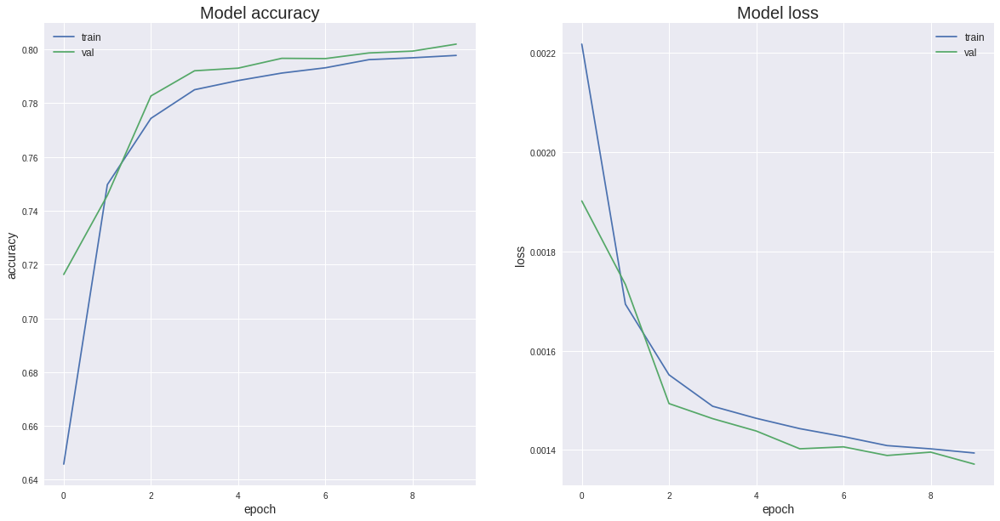

In [ ]:
# summarize history for accuracy
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 10))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.plot(history['accuracy'])
ax1.plot(history['val_accuracy'])  
ax1.set_title('Model accuracy', fontsize = 20)
ax1.set_ylabel('accuracy', fontsize = 14)
ax1.set_xlabel('epoch', fontsize = 14)
ax1.legend(['train', 'val'], loc='best', fontsize = 12)

# summarize history for loss
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.plot(history['loss'])
ax2.plot(history['val_loss']) 
ax2.set_title('Model loss', fontsize = 20)
ax2.set_ylabel('loss', fontsize = 14)
ax2.set_xlabel('epoch', fontsize = 14)
ax2.legend(['train', 'val'], loc='best', fontsize = 12)
plt.show()

Once the model is saved, it is used to evaluate its performance over the test set: the model is able to generalise over a new set of data with high accuracy.
it is possible to evaluate the performance of the model by calculating the confusion matrix, a specific table layout that allows visualization of the performance of an algorithm, typically a supervised learning one. It is characterized by two dimensions ("correct" and "predicted"), and identical sets of "classes" in both dimensions. 
The main diagonal gives the correct predictions, that are the cases where the actual values and the model predictions are the same.

In [ ]:
del X_train, y_train
testScore = model.evaluate(X_test, y_test, verbose=0)
print(testScore)
y_pred = model.predict(X_test)
matrix = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))

[0.0013731204671785235, 0.801685094833374]


The confusion matrix represent a way to see the behaviour of the predicted sample. In the y-axis there are the correct values and in the x-axis there are the predicted ones and, in the diagonal, is possible to see the correlation between them: lighter is the value, higher is the number of time in which the samples were correctly predicted. In this case the confusion matrix was splitted since there were a high number of samples and, by plotting all of them at the same time, it was not understandable but the coloured diagonal that characterises the correct prediction of the elements is still visible.

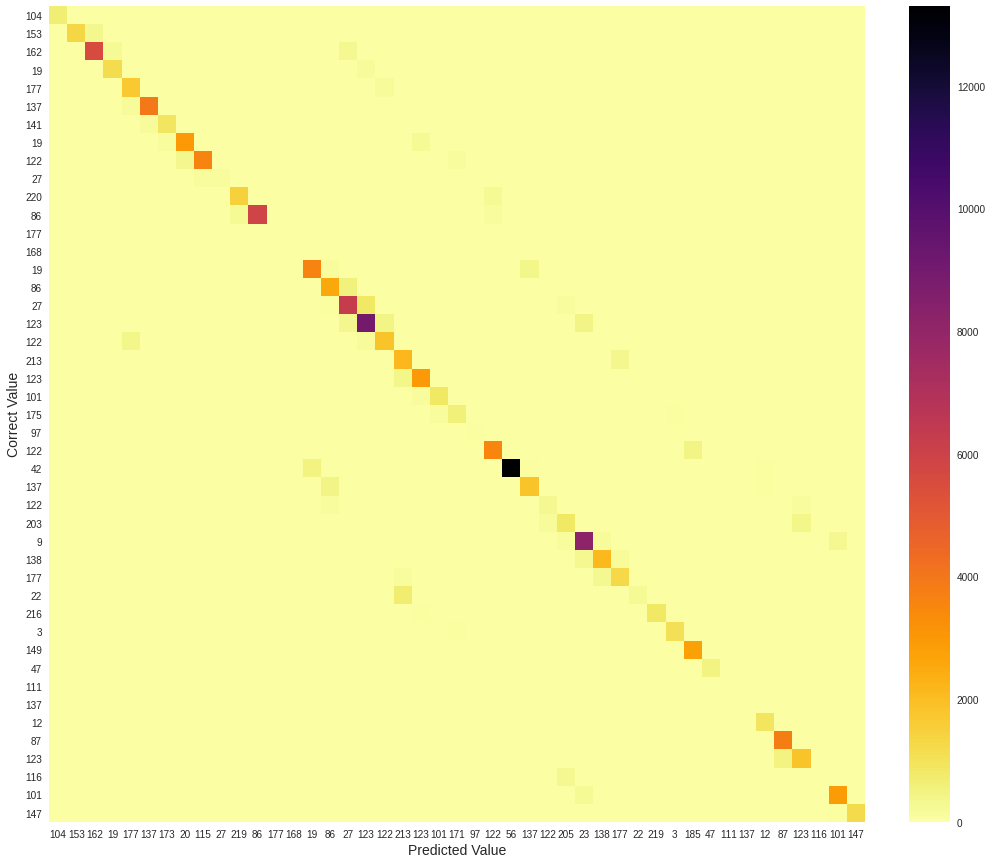

In [ ]:
plt.figure(figsize=(20,15))
ticks=np.linspace(0, 44,num=45)
im = plt.imshow(matrix[0:45, 0:45],cmap = cm.get_cmap('inferno').reversed())
plt.colorbar(fraction=0.046, pad=0.04)
plt.yticks(ticks, y_test[0:45].argmax(axis=1),fontsize=10)
plt.xticks(ticks, y_pred[0:45].argmax(axis=1),fontsize=10)
plt.ylabel("Correct Value",fontsize = 14)
plt.xlabel("Predicted Value",fontsize = 14)
plt.grid(False)
plt.show()

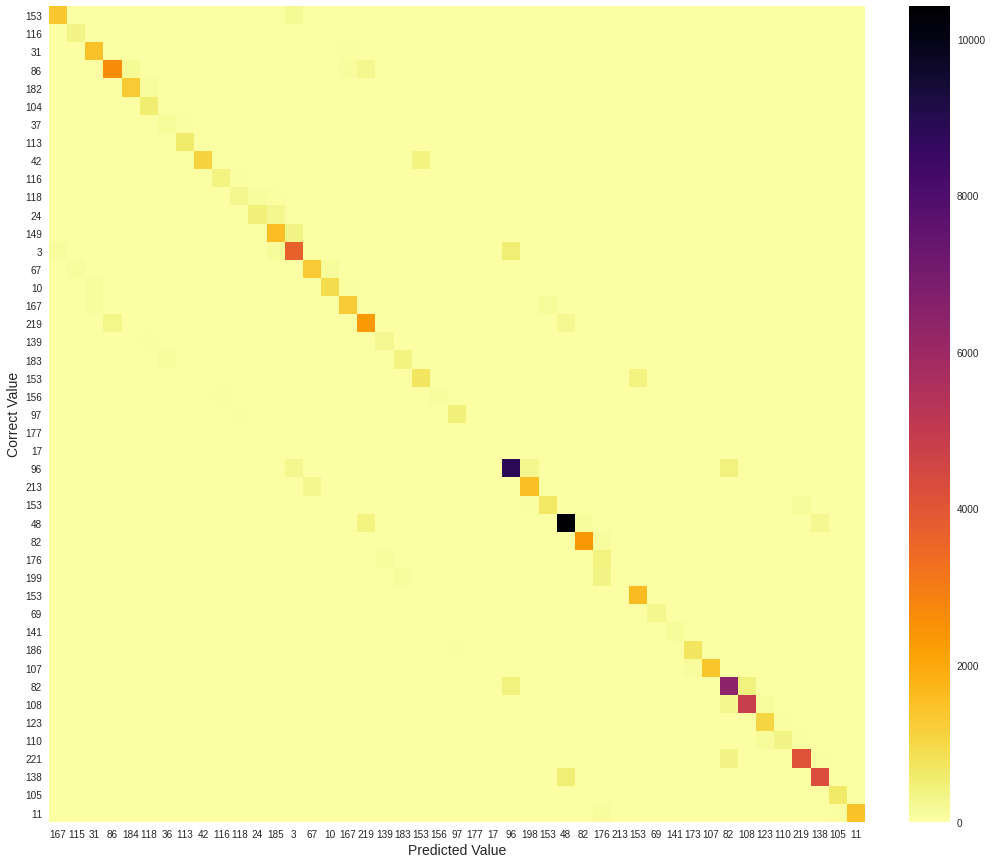

In [ ]:
plt.figure(figsize=(20,15))
ticks=np.linspace(0, 44,num=45)
im = plt.imshow(matrix[45:90, 45:90],cmap = cm.get_cmap('inferno').reversed())
plt.colorbar(fraction=0.046, pad=0.04)
plt.yticks(ticks, y_test[45:90].argmax(axis=1),fontsize=10)
plt.xticks(ticks, y_pred[45:90].argmax(axis=1),fontsize=10)
plt.ylabel("Correct Value",fontsize = 14)
plt.xlabel("Predicted Value",fontsize = 14)
plt.grid(False)
plt.show()

We have considered R2 as a metrics to understand the accuracy of our model. It corresponds to the squared correlation between the observed outcome values and the predicted values by the model. The higher the R2 score, the better the model. In our case we have achieved a score close to one which can be considered a good result. 

In [ ]:
print("R2 SCORE VALUE: ", r2_score(y_test.argmax(axis=1), y_pred.argmax(axis=1)))


R2 SCORE VALUE:  0.9897920000397201


In this case, iterative continuation is possible by also predicting cells at later times. This was not done in our case, as the size of the dataset and the available ram made it computationally impossible. We therefore stopped at the prediction of the second cell: we replaced C-3 with the elements previously predicted and it is possible to use the same network to predict C+2. 

However, it should be considered that accuracy decreases as the number of cells predicted increases, as errors in the prediction of C+1 propagate to subsequent instants. 

In [ ]:
def predictValue(ID):
  traces = loadmat('drive/My Drive/Colab Notebooks/traces.mat')
  data = traces['traces_data']
  columns = ['time', 'ID', 'car_x', 'car_y', 'm/s', 'C', 'C+1', 'C-1', 'C-2', 'C-3']

  df = pd.DataFrame(data, columns=columns)
  df.drop(df[df["C-1"]<0].index , inplace = True)
  df.drop(df[df["C-2"]<0].index , inplace = True)
  df.drop(df[df["C-3"]<0].index , inplace = True)
  df.drop(df[df["C+1"]<0].index , inplace = True)
  #print(df['ID'][257])
  test = df[df["ID"] == ID]
  test = test[['C', 'C-1', 'C-2', 'C-3']]
  test_c1 = (test.to_numpy()).reshape(test.shape[0], test.shape[1], 1)
  y_pred_c1 = model.predict(test_c1)
  n = test.columns[3]
  test.drop(n, axis = 1, inplace = True)
  test['C+1_pred'] = y_pred_c1.argmax(axis=1)
  test = test[['C-2', 'C-1', 'C', 'C+1_pred']]

  df = df[['time', 'ID', 'car_x', 'car_y']]
  del data, columns, test_c1

  test_c2 = (test.to_numpy()).reshape(test.shape[0], test.shape[1], 1)
  y_pred_c2 = model.predict(test_c2)
  test['C+2_pred'] = y_pred_c2.argmax(axis=1)
  test = test[['C-2', 'C-1', 'C', 'C+1_pred', 'C+2_pred']]

  del test_c2, y_pred_c2

  test.insert(0, "ID", df["ID"])
  test.insert(0, "time", df['time'])

  t = df[df["ID"] == ID]
  x_vec = t["car_x"].to_numpy()
  y_vec = t["car_y"].to_numpy()
  del df

  return test, x_vec, y_vec

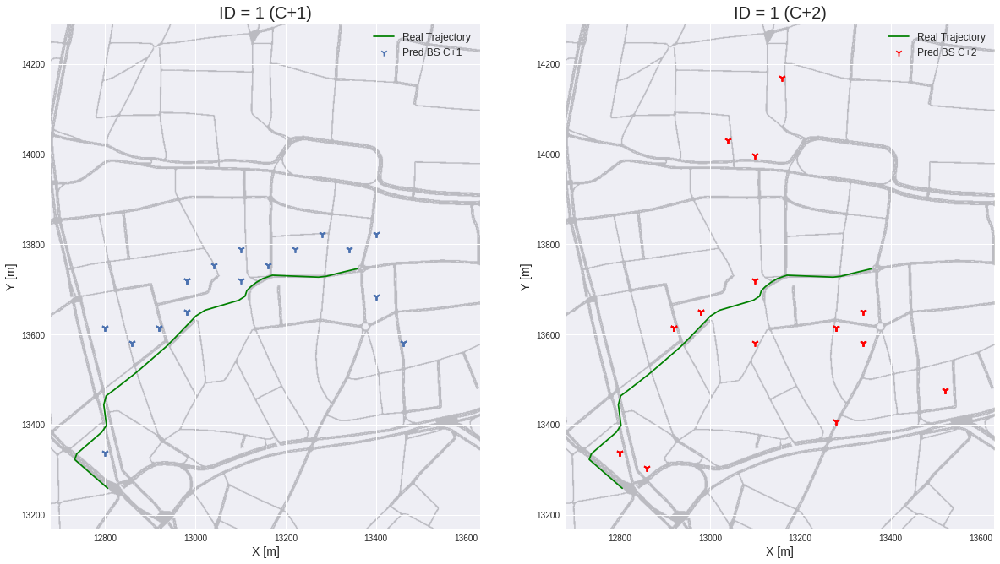

In [ ]:
test, x_vec, y_vec = predictValue(1)
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax1.scatter(x=BS_loc["X"][test.iloc[:, 5]], y=BS_loc["Y"][test.iloc[:, 5]], s = 70, marker = "1",linewidths=1, label = "Pred BS C+1")
ax1.set_title("ID = 1 (C+1)", fontsize=20)
ax1.legend(loc="best",fontsize = 12)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]",fontsize = 14)
ax1.set_ylabel("Y [m]",fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax2.scatter(x=BS_loc["X"][test.iloc[:, 6]], y=BS_loc["Y"][test.iloc[:, 6]], s = 70, c='r', marker = "1",linewidths=1, label = "Pred BS C+2")
ax2.set_title("ID = 1 (C+2)", fontsize=20)
ax2.legend(loc="best",fontsize = 12)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]",fontsize = 14)
ax2.set_ylabel("Y [m]",fontsize = 14)
plt.show()

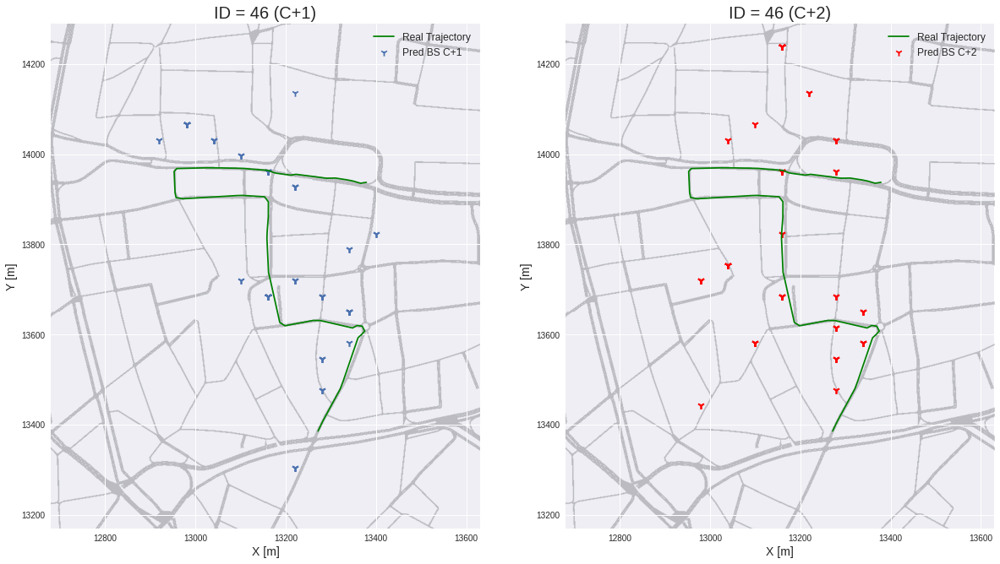

In [ ]:
test, x_vec, y_vec = predictValue(46)
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax1.scatter(x=BS_loc["X"][test.iloc[:, 5]], y=BS_loc["Y"][test.iloc[:, 5]], s = 70, marker = "1",linewidths=1, label = "Pred BS C+1")
ax1.set_title("ID = 46 (C+1)", fontsize=20)
ax1.legend(loc="best",fontsize = 12)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]",fontsize = 14)
ax1.set_ylabel("Y [m]",fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax2.scatter(x=BS_loc["X"][test.iloc[:, 6]], y=BS_loc["Y"][test.iloc[:, 6]], s = 70, c='r', marker = "1",linewidths=1, label = "Pred BS C+2")
ax2.set_title("ID = 46 (C+2)", fontsize=20)
ax2.legend(loc="best",fontsize = 12)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]",fontsize = 14)
ax2.set_ylabel("Y [m]",fontsize = 14)
plt.show()

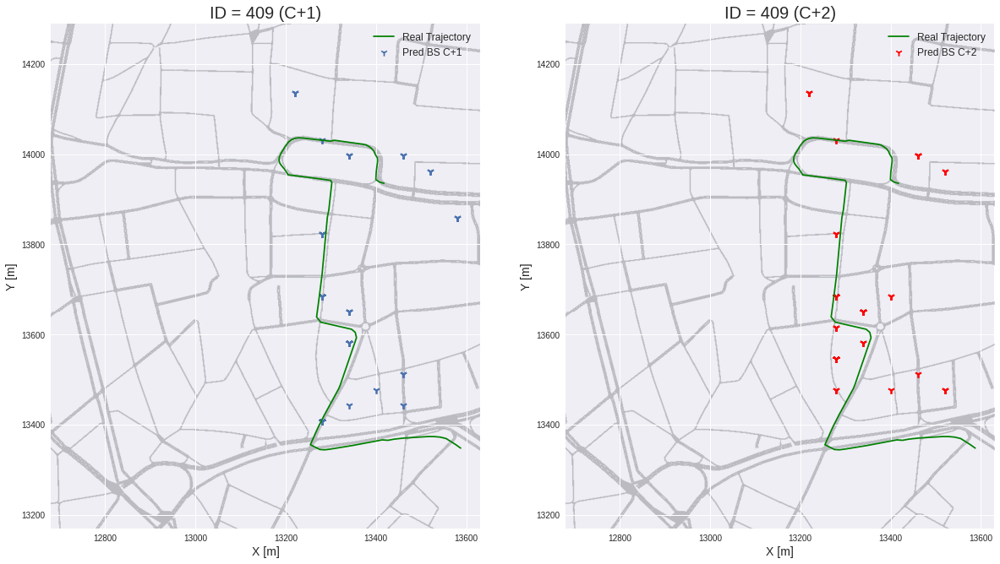

In [ ]:
test, x_vec, y_vec = predictValue(409)
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax1.scatter(x=BS_loc["X"][test.iloc[:, 5]], y=BS_loc["Y"][test.iloc[:, 5]], s = 70, marker = "1",linewidths=1, label = "Pred BS C+1")
ax1.set_title("ID = 409 (C+1)", fontsize=20)
ax1.legend(loc="best",fontsize = 12)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]",fontsize = 14)
ax1.set_ylabel("Y [m]",fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax2.scatter(x=BS_loc["X"][test.iloc[:, 6]], y=BS_loc["Y"][test.iloc[:, 6]], s = 70, c='r', marker = "1",linewidths=1, label = "Pred BS C+2")
ax2.set_title("ID = 409 (C+2)", fontsize=20)
ax2.legend(loc="best",fontsize = 12)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]",fontsize = 14)
ax2.set_ylabel("Y [m]",fontsize = 14)
plt.show()

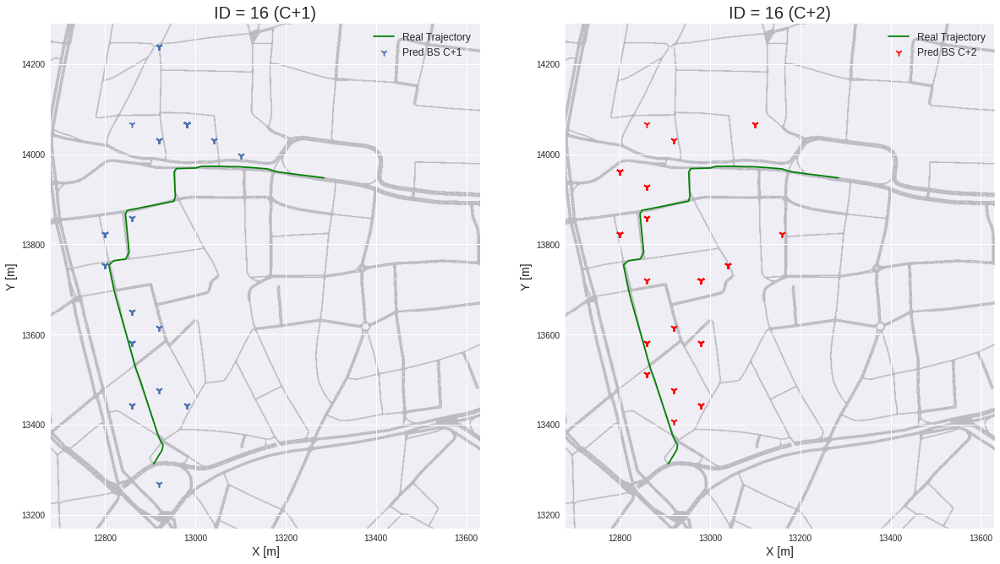

In [ ]:
test, x_vec, y_vec = predictValue(16)
gridsize = (1, 2)
fig = plt.figure(figsize=(20, 20))

ax1 = plt.subplot2grid(gridsize, (0, 0))
ax1.imshow(img,extent=extent, alpha= 0.2)   
ax1.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax1.scatter(x=BS_loc["X"][test.iloc[:, 5]], y=BS_loc["Y"][test.iloc[:, 5]], s = 70, marker = "1",linewidths=1, label = "Pred BS C+1")
ax1.set_title("ID = 16 (C+1)", fontsize=20)
ax1.legend(loc="best",fontsize = 12)
ax1.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax1.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax1.set_xlabel("X [m]",fontsize = 14)
ax1.set_ylabel("Y [m]",fontsize = 14)

ax2 = plt.subplot2grid(gridsize, (0, 1))
ax2.imshow(img,extent=extent, alpha= 0.2)   
ax2.plot(x_vec, y_vec, 'g',label="Real Trajectory") #real
scatter = ax2.scatter(x=BS_loc["X"][test.iloc[:, 6]], y=BS_loc["Y"][test.iloc[:, 6]], s = 70, c='r', marker = "1",linewidths=1, label = "Pred BS C+2")
ax2.set_title("ID = 16 (C+2)", fontsize=20)
ax2.legend(loc="best",fontsize = 12)
ax2.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
ax2.axis(xmin = limit_coord[0], xmax = limit_coord[1])
ax2.set_xlabel("X [m]",fontsize = 14)
ax2.set_ylabel("Y [m]",fontsize = 14)
plt.show()

### GIF

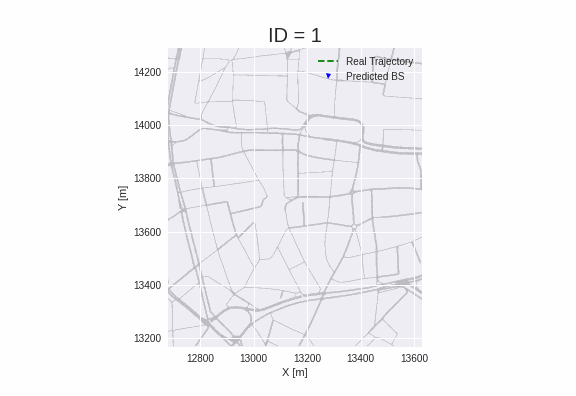

In [ ]:
gifPath = "drive/My Drive/Colab Notebooks/demo_1_RNN.gif" 
# Display GIF
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

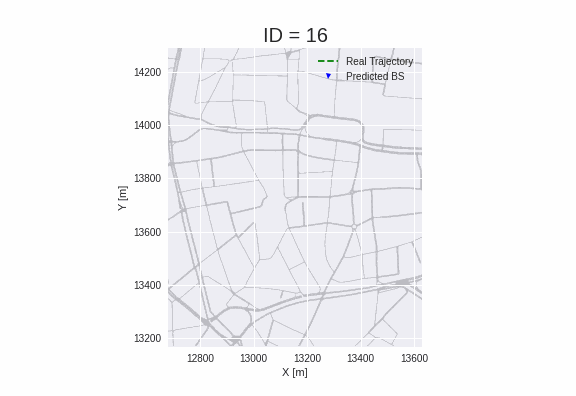

In [ ]:
gifPath = "drive/My Drive/Colab Notebooks/demo_16_RNN.gif" 
# Display GIF
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

### GIF CODE

In [ ]:
from matplotlib.animation import FuncAnimation, PillowWriter
fig,ax = plt.subplots()
ln1, = plt.plot([], [], 'g--',label="Real Trajectory",markersize=2)
ln2, = plt.plot([], [],'bv', markersize = 5, label="Predicted BS")

In [ ]:
def init():
  ax.imshow(img,extent=extent, alpha= 0.2)
  ax.set_xlabel("X [m]")
  ax.set_ylabel("Y [m]")
  ax.axis(ymin = limit_coord[2], ymax =  limit_coord[3])
  ax.axis(xmin = limit_coord[0], xmax = limit_coord[1])
  ax.legend(loc="best")
  ax.set_title('ID = 1', fontsize=20)

def update(i):
  ln1.set_data(x_vec[:i],y_vec[:i])
  ln2.set_data(BS_loc['X'][test.iloc[:i, 5]],BS_loc['Y'][test.iloc[:i, 5]] )

In [ ]:
ani = FuncAnimation(fig,update,init_func=init)
plt.show()

In [ ]:
writer = PillowWriter(fps=10)  
ani.save("drive/My Drive/Colab Notebooks/demo_1_RNN.gif", writer=writer)

## Conclusion

In this project we have exploited two different approaches for the estimation of the next serving BS: the **Kalman Filter** and the **Recurrent Neural Network**. 
The Kalman Flter, in telecommunications, is used to track a mobile user connected  to  a  wireless  network. In our case we have implemented a procedure, based on the minimum Euclidean distance, to estimate the next serving BS from the predicted position of the car.
Instead in the Recurrent Neural Network the prediction is based on a training data which contains the information of C, C-1, C-2 and C-3, taken from the original dataset. 
Both the implemented methods work well, apparently the KF achieves better results but the minimum Euclidean distance is not always the best metric to enhance the performance of a 5G network. In the other hand the RNN is an innovative approach and the prediction accuracy could be improved by training the network with a more extensive dataset.